# Make pictures and tables

------
This notebook reproduces images from
**"Multi-task learning for low-frequency extrapolation and elastic model building from seismic data"**

by [Ovcharenko Oleg](https://ovcharenkoo.com/), [Vladimir Kazei](https://vkazei.com/), [Tariq Alkhalifah](https://sites.google.com/a/kaust.edu.sa/tariq/home) and [Daniel Peter](https://github.com/danielpeter), KAUST, Saudi Arabia, 2021

In [1]:
import os
import sys
import copy
import glob
import numpy as np
import segyio
import pandas as pd

from natsort import natsorted
from scipy import signal
from skimage.transform import resize

from IPython.display import clear_output

import utils.shared as sd
import utils.loaders as ld
import utils.vis as vis

print(f'Python: {sys.prefix}')

import matplotlib as mpl
import matplotlib.gridspec as gridspec

fontsize = 11
params = {
    # 'text.latex.preamble': ['\\usepackage{gensymb}'],
    # 'image.origin': 'lower',
    'image.interpolation': 'nearest',
    'figure.dpi' : 150,
    # 'image.cmap': 'gray',
    'axes.grid': False,
    'savefig.dpi': 150,  # to adjust notebook inline plot size
    'axes.labelsize':fontsize,  # fontsize for x and y labels (was 10)
    'axes.titlesize':fontsize,
    'font.size':fontsize,  # was 10
    'legend.fontsize': fontsize,  # was 10
    'xtick.labelsize':fontsize,
    'ytick.labelsize':fontsize,
    'text.usetex': True,
    # 'figure.figsize': [3.39, 2.10],
    'font.family': 'serif',
}
mpl.rcParams.update(params)
# mpl.rcParams['figure.dpi']= 100
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

Python: /home/ovcharoo/work/env_torch


In [2]:
dx = 25
dt = 0.002
dt_net = 0.016
par_agc = {'win': 150, 'amp': 1, 'eps': 1e-6}
par_mutter = {'k': 6, 'b': -100, 'r': 30}
par_blend_low_high ={'fs': 1/dt, 'upscale': 8, 'pad': (0, 8), 'flo': 4, 'btype': 'high'}
par_ref = {'fs': 1/dt, 'flo': 4, 'fhi': 5, 'order': 8, 'btype': 'band'}

# Load networks

In [3]:
root_pretrained = './pretrained_files/trained_nets/'
root_data = './pretrained_files/data/'

In [4]:
def nothing(x):
    """Placeholder for any pre- and post-processing function on input and output to the network
    e.g. geometric spreading correction"""
    return x


nets = []
net_titles = []
net_colors = []
fns = []

n_ens = 10

from utils.archs import UNet_ext,  Encoder, HeadData, HeadModel, Ensemble, Blend

# UNet to predict low
nets.append(Ensemble(UNet_ext(1, 1), None, None, os.path.join(root_pretrained, 'ex1_unet_l/'), 
                     n_ens, old=True, single_out=True))
net_titles.append('unet_l')
net_colors.append('g')
fns.append([nothing, nothing])


# Multi-column to predict low (L)
net_l = Ensemble(Encoder(1), 
                     HeadData(layers=[(96, 32), (32, 16)], layers_out=(16, 1), kernel_sizes=[4, 4], strides=[2, 2], pads=[1, 1]), 
                     HeadModel(layers=[(96, 32), (32, 1)], kernel_sizes=[3, 3], strides=[1, 1]),
                     os.path.join(root_pretrained, 'ex2_multi_l_enc/'), n_ens)
nets.append(net_l)
net_titles.append('l')
net_colors.append('navy')
fns.append([nothing, nothing])


# Multi-column to predict low + correlation loss (LC)
net_lp = Ensemble(Encoder(1), 
                     HeadData(layers=[(96, 32), (32, 16)], layers_out=(16, 1), kernel_sizes=[4, 4], strides=[2, 2], pads=[1, 1]), 
                     HeadModel(layers=[(96, 32), (32, 1)], kernel_sizes=[3, 3], strides=[1, 1]),
                     os.path.join(root_pretrained, 'ex4_multi_lc/'), n_ens)
nets.append(net_lp)
net_titles.append('lc')
net_colors.append('yellow')
fns.append([nothing, nothing])


# Predict low+corr+model, without ultra-low freqs in second channel of data decoder (LCM)
net_lpm = Ensemble(Encoder(1), 
                     HeadData(layers=[(96, 32), (32, 16)], layers_out=(16, 1), kernel_sizes=[4, 4], strides=[2, 2], pads=[1, 1]), 
                     HeadModel(layers=[(96, 32), (32, 1)], kernel_sizes=[3, 3], strides=[1, 1]),
                     os.path.join(root_pretrained, 'ex5_multi_lcm/'), n_ens)
nets.append(net_lpm)
net_titles.append('lcm')
net_colors.append('r:')
fns.append([nothing, nothing])

nets = tuple(nets)

Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_0/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_1/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_2/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_3/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_4/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_5/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_6/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_7/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_8/0_net_g.pth
Load weights for _g
Loading model from ./pretrained_files/trained_nets/ex1_unet_l_9/0_net_g.pth
Load weights for _encoder
Loading model 

Load weights for _model
Loading model from ./pretrained_files/trained_nets/ex2_multi_l_enc_8/0_net_model.pth
Not found ./pretrained_files/trained_nets/ex2_multi_l_enc_8/0_net_model.pth!
Loading history from ./pretrained_files/trained_nets/ex2_multi_l_enc_8/history_encoder.pkl...
Loading history from ./pretrained_files/trained_nets/ex2_multi_l_enc_8/history_data.pkl...
Failed to load history form ./pretrained_files/trained_nets/ex2_multi_l_enc_8/history_data.pkl, [Errno 2] No such file or directory: './pretrained_files/trained_nets/ex2_multi_l_enc_8/history_data.pkl'
Loading history from ./pretrained_files/trained_nets/ex2_multi_l_enc_8/history_model.pkl...
Failed to load history form ./pretrained_files/trained_nets/ex2_multi_l_enc_8/history_model.pkl, [Errno 2] No such file or directory: './pretrained_files/trained_nets/ex2_multi_l_enc_8/history_model.pkl'
Loading history from ./pretrained_files/trained_nets/ex2_multi_l_enc_8/history_lr.pkl...
Load sigmas from ./pretrained_files/traine

Load weights for _encoder
Loading model from ./pretrained_files/trained_nets/ex4_multi_lc_9/0_net_encoder.pth
Load weights for _data
Loading model from ./pretrained_files/trained_nets/ex4_multi_lc_9/0_net_data.pth
Load weights for _model
Loading model from ./pretrained_files/trained_nets/ex4_multi_lc_9/0_net_model.pth
Not found ./pretrained_files/trained_nets/ex4_multi_lc_9/0_net_model.pth!
Loading history from ./pretrained_files/trained_nets/ex4_multi_lc_9/history_encoder.pkl...
Loading history from ./pretrained_files/trained_nets/ex4_multi_lc_9/history_data.pkl...
Loading history from ./pretrained_files/trained_nets/ex4_multi_lc_9/history_model.pkl...
Failed to load history form ./pretrained_files/trained_nets/ex4_multi_lc_9/history_model.pkl, [Errno 2] No such file or directory: './pretrained_files/trained_nets/ex4_multi_lc_9/history_model.pkl'
Loading history from ./pretrained_files/trained_nets/ex4_multi_lc_9/history_lr.pkl...
Load sigmas from ./pretrained_files/trained_nets/ex4_m

Load weights for _encoder
Loading model from ./pretrained_files/trained_nets/ex5_multi_lcm_9/0_net_encoder.pth
Load weights for _data
Loading model from ./pretrained_files/trained_nets/ex5_multi_lcm_9/0_net_data.pth
Load weights for _model
Loading model from ./pretrained_files/trained_nets/ex5_multi_lcm_9/0_net_model.pth
Loading history from ./pretrained_files/trained_nets/ex5_multi_lcm_9/history_encoder.pkl...
Loading history from ./pretrained_files/trained_nets/ex5_multi_lcm_9/history_data.pkl...
Loading history from ./pretrained_files/trained_nets/ex5_multi_lcm_9/history_model.pkl...
Failed to load history form ./pretrained_files/trained_nets/ex5_multi_lcm_9/history_model.pkl, [Errno 2] No such file or directory: './pretrained_files/trained_nets/ex5_multi_lcm_9/history_model.pkl'
Loading history from ./pretrained_files/trained_nets/ex5_multi_lcm_9/history_lr.pkl...
Load sigmas from ./pretrained_files/trained_nets/ex5_multi_lcm_9


In [5]:
print(f'Loaded {len(nets)} sets of networks')
print(net_titles)

Loaded 4 sets of networks
['unet_l', 'l', 'lc', 'lcm']


# Predictions start here

In [6]:
def hard_blend(dat_lo, dat_hi, dt, fedge):
    assert dat_lo.shape == dat_hi.shape
    h, w = dat_lo.shape[-2:]
    dat_lo_fx = np.fft.rfft(dat_lo, w)
    dat_hi_fx = np.fft.rfft(dat_hi, w)
    ff = np.fft.rfftfreq(dat_hi.shape[-1], d=dt)

    where_left = np.where(ff < fedge)[0]
    where_right = np.where(ff >= fedge)[0]
    print(where_right.shape)
    
    dat_lo_fx[..., where_right] = dat_hi_fx[..., where_right]
    out = np.fft.irfft(dat_lo_fx, w)
    return out

In [7]:
def predict_for_net(net, loader):
    data_l = np.zeros_like(data_p)
    data_h = np.zeros_like(data_p)
    data_blend = np.zeros_like(data_p)

    for i,f in enumerate(range(len(loader))):
        clear_output()
        print(f'{i+1}/{len(loader)}\n{f}')
        dh_cgg = loader.__getitem__(i)[0]

        # Predict low-frequencies and upscale it to 2 ms sampling
        lfp = signal.resample(net.predict(dh_cgg, pred_idx=0, pred_chan=1), 3000, axis=-1)

        # Take input data (strict zero < 4 Hz) and upsample it to 2 ms sampling
        hf = signal.resample(dh_cgg[0,...], 3000, axis=-1)
        # And match it with respective range of field data
        hf = sd.match_amp(hf, ld.bandpass(data_p[i, ...], **par_blend_low_high))

        # Now extract range [4, 5] Hz and normalize low-freq prediction on it
        should_be_this = np.abs(ld.bandpass(hf, **par_ref)).max()
        got_this = np.abs(ld.bandpass(lfp, **par_ref)).max()  
        ratio = should_be_this / got_this
        lf = lfp * ratio
        print(should_be_this, got_this, ratio)

        data_l[i, ...] = lf 
        data_h[i, ...] = hf 

        hft = data_p[i, :, :]
        blend = hard_blend(lf, hft, dt, 4)
        blend = ld.mutter(blend, **par_mutter)
        data_blend[i, ...] = blend
    return data_blend, data_h, data_l 

## Pearson coefficients for each net

Create input band-limited data to the network

In [8]:
root_su = os.path.join(root_data, 'test_syn/su/')
fnames = sd.get_fnames_pattern(root_su + '*.su.*')  
print(f'Found {len(fnames)} files in {root_su}')

loader_cgg, cube_cgg, scalers = sd.make_cube_and_loader(fnames)

80/80
./pretrained_files/data/test_syn/su/seis_p.su.shot80
(324, 3000)
Start split for (80, 324, 3000)
Start making cubes from lists for list 80, where each sublist 3
(80, 324, 376)
(80, 324, 376)
(80, 324, 376)
(80, 324, 376) (80, 324, 376) (80, 324, 376) (80, 324, 376)


Read the same full-band data

In [9]:
shots = []
for file in fnames:
    with segyio.su.open(file, endian='little', ignore_geometry=True) as f:
                    shots.append(np.array([np.copy(tr) for tr in f.trace]))
        
data_p = np.concatenate([np.expand_dims(s, 0) for s in shots], 0)
print(data_p.shape)

(80, 324, 3000)


### Warining! The cell below takes about 10 minutes! It doesn't have much dependencies after that so no need to run it unless number of networks changed

In [10]:
this_fhi = 3

net_preds = []
net_lbls = []
for inet, this_net in enumerate(nets):
    data_blend, data_h, data_l = predict_for_net(this_net, loader_cgg)
    these_preds = []
    these_lbls = []
    for idat in range(data_blend.shape[0]):
        pred = data_blend[idat, ...]
        lbl = data_p[idat, ...]
        
        pred = ld.bandpass(pred, fs=1/dt, fhi=this_fhi, btype='low', order=8)
        lbl = ld.bandpass(lbl, fs=1/dt, fhi=this_fhi, btype='low', order=8)
        
        these_preds.append(np.expand_dims(pred, 0))
        these_lbls.append(np.expand_dims(lbl, 0))
        # This list contains [(1, noffset),...] pearson coefficients for each trace
    net_preds.append(np.concatenate(these_preds, 0))
    net_lbls.append(np.concatenate(these_lbls, 0))
net_preds = tuple(net_preds)
net_lbls = tuple(net_lbls)

80/80
79
16.312527532682186 0.46212982832755434 35.29858176806536
(1477,)


In [11]:
print(len(net_preds))

4


# Pearson in squuares

In [12]:
pearsons_nets = []
for inet in range(len(nets)):
    print(f'{inet+1}/{len(nets)}', end='\r')
    this_pred = net_preds[inet]
    this_lbl = net_lbls[inet]
    pearsons_nets.append(np.concatenate([np.expand_dims(vis.pearsonr(this_lbl[i, ...], this_pred[i, ...])[:, 0], 0) for i in range(this_lbl.shape[0])]))    

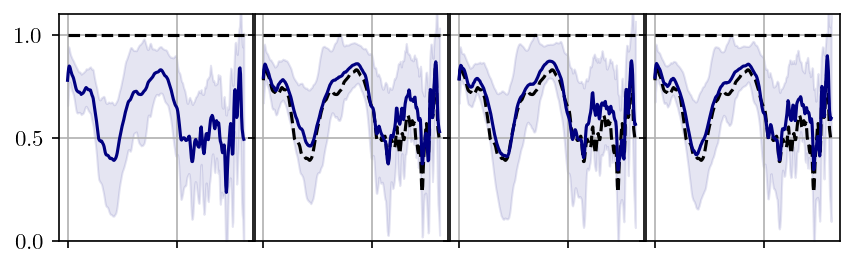

In [13]:
def plot_metric_vs_offset(curves, ylabel='', val_true=1, ylim=None, legend_loc=3, plot_all=False):
    nx = len(curves)
    nz = 1
    fsize=2
    plt.figure(figsize=(0.84*nx*fsize, nz*fsize))
    gs1 = gridspec.GridSpec(nz, nx)
    gs1.update(wspace=0.01, hspace=0.01)
    
    mean_unet = np.mean(curves[0], 0)
    xax = np.arange(curves[0].shape[-1]) * dx / 1000
    for icurve, curve in enumerate(curves):
        ax = plt.subplot(gs1[icurve])
        ax.grid('on')
        mean_line = np.mean(curve, 0)# + icurve
        std_line = np.std(curve, 0)

        ax.fill_between(xax, mean_line - std_line, mean_line + std_line, alpha=0.1, 
                        color='navy', linestyle='solid')
        if icurve > 0:
            ax.plot(xax, mean_unet, color='black', linestyle='--')
            ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.plot(xax, mean_line, color='navy', linestyle='solid')
        ax.axis('auto')
        ax.plot(xax, val_true * np.ones_like(mean_line), color='k', linestyle='--', label='True')
        if ylim:
            ax.set_ylim(ylim)

plot_metric_vs_offset(pearsons_nets, ylabel='Pearson coefficient', val_true=1, ylim=[0, 1.1], 
                      plot_all=False, legend_loc=3)

# Last net

In [14]:
# net = nets[-1]
# data_blend, data_h, data_l = predict_for_net(net, loader_cgg)

In [15]:
hft = data_p[-1, ...]
hf = data_h[-1, ...]
lf = data_l[-1, ...]
blend = data_blend[-1, ...]

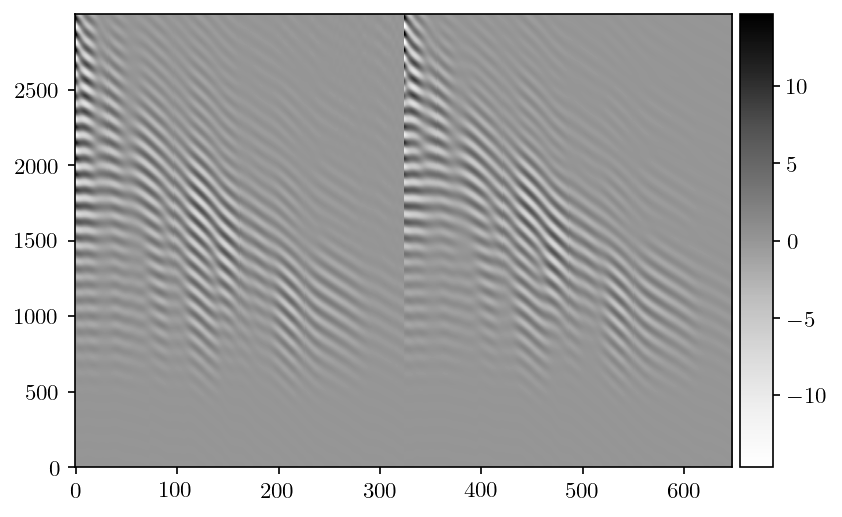

In [16]:
# Compare shared range from 4 to 5 Hz in time-offset domain
want_this = ld.bandpass(hf, **par_ref)
have_this = ld.bandpass(lf, **par_ref)
vis.plot_shot([want_this, have_this], pclip=0.9)

# Deep analysis of what is below frequency

In [17]:
i = -1
crop_bottom = 15
print(crop_bottom)

15


(80, 324, 3000)
Low true (324, 2820)
	min:	-3.156913e+01	max:	2.987572e+01
Low predicted (324, 2820)
	min:	-2.775561e+01	max:	2.744674e+01
Low true (324, 2820)
	min:	-7.384830e+00	max:	7.483153e+00
Low predicted (324, 2820)
	min:	-6.726295e+00	max:	7.408656e+00
Low true (324, 2820)
	min:	-1.077684e+00	max:	1.186639e+00
Low predicted (324, 2820)
	min:	-1.110001e+00	max:	1.125666e+00


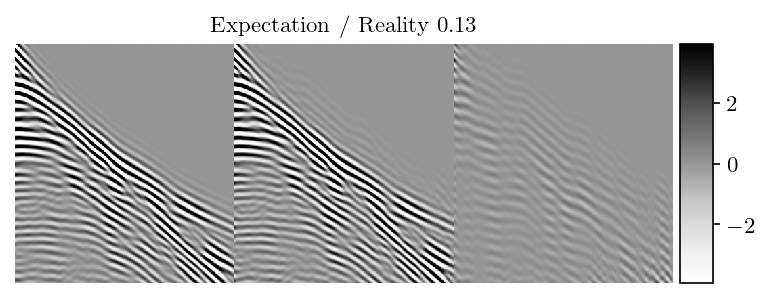

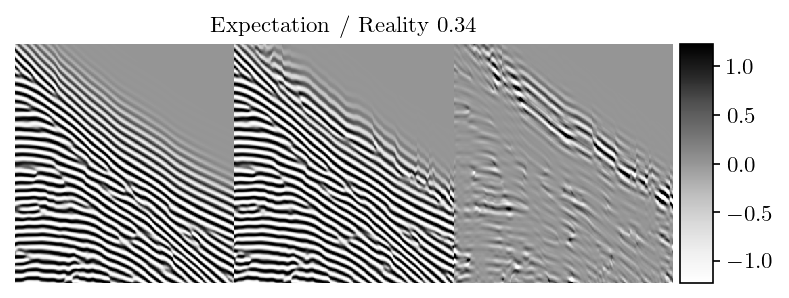

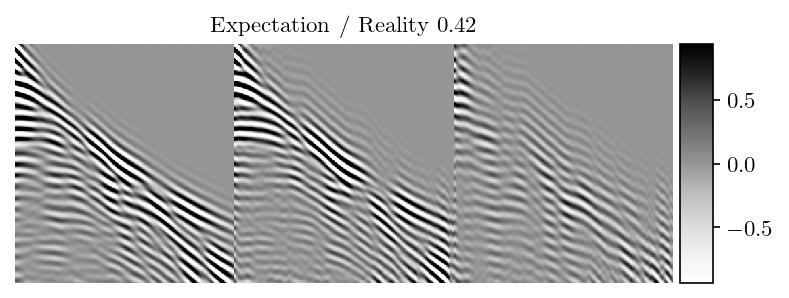

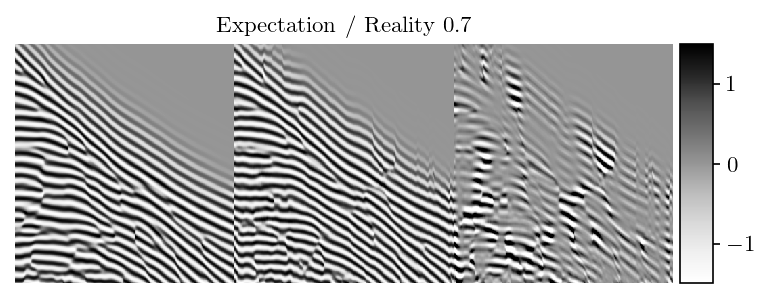

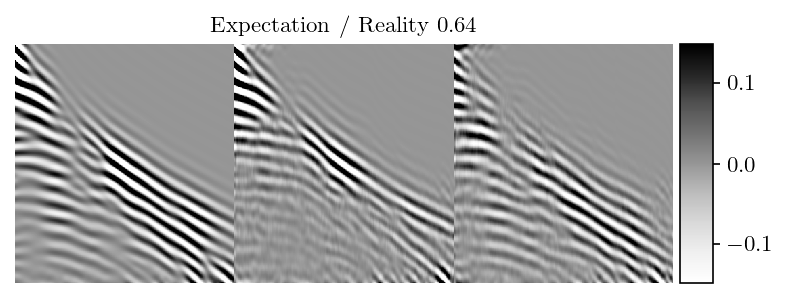

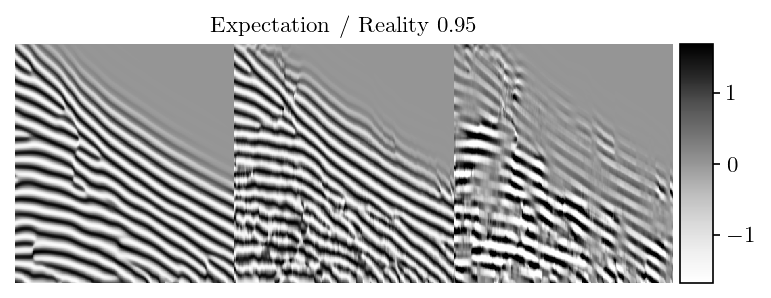

In [18]:
# Expected ideal low frequencies
print(data_p.shape)

raws = []
agcs = []
for this_fhi in [5, 4, 3]:
    lft = ld.bandpass(data_p[i, :, :], fs=1/dt, fhi=this_fhi, btype='low', order=8)
    lfs = ld.bandpass(data_blend[i, :, :], fs=1/dt, fhi=this_fhi, btype='low', order=8)

    
    lfta = vis.agc(ld.mutter(lft, **par_mutter), **par_agc)[0]
    lfsa = vis.agc(ld.mutter(lfs, **par_mutter), **par_agc)[0]
    lfta = ld.mutter(lfta, **par_mutter)[..., crop_bottom*4:-crop_bottom*8]
    lfsa = ld.mutter(lfsa, **par_mutter)[..., crop_bottom*4:-crop_bottom*8]
    
    lft = lft[..., crop_bottom*4:-crop_bottom*8]
    lfs = lfs[..., crop_bottom*4:-crop_bottom*8]
    
    print('Low true {}\n\tmin:\t{:e}\tmax:\t{:e}'.format(lft.shape, lft.min(), lft.max()))
    print('Low predicted {}\n\tmin:\t{:e}\tmax:\t{:e}'.format(lfs.shape, lfs.min(), lfs.max()))

    lfts = lft[..., ::8]
    lfss = lfs[..., ::8]
    lfts_lfss = lfts - lfss
    
    lftas = lfta[..., ::8]
    lfsas = lfsa[..., ::8]
    lftas_lfsas = lftas - lfsas
    
    raws.append([lfts, lfss, lfts_lfss])    
    agcs.append([lftas, lfsas, lftas_lfsas])
    
    # lfs_match = match_amp(lfts, lfs)
    vis.plot_shot([lfts, lfss, lfts - lfss], axis=False, pclip=0.125, title=f'Expectation / Reality {vis.relative_rms(lfts, lfts_lfss)}')
    vis.plot_shot([lftas, lfsas, lftas - lfsas], axis=False, pclip=0.5, title=f'Expectation / Reality {vis.relative_rms(lftas, lftas_lfsas)}')
    
    

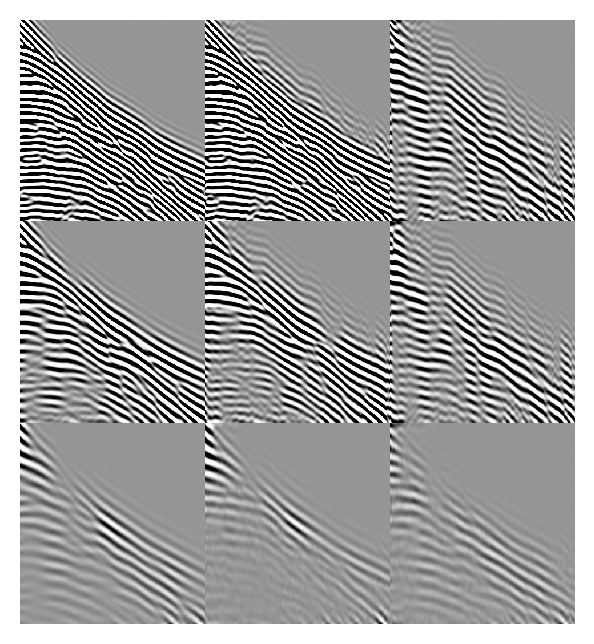

In [19]:
vis.plot_nxm(raws, pclip=0.01, colorbar=False, dpi=200)

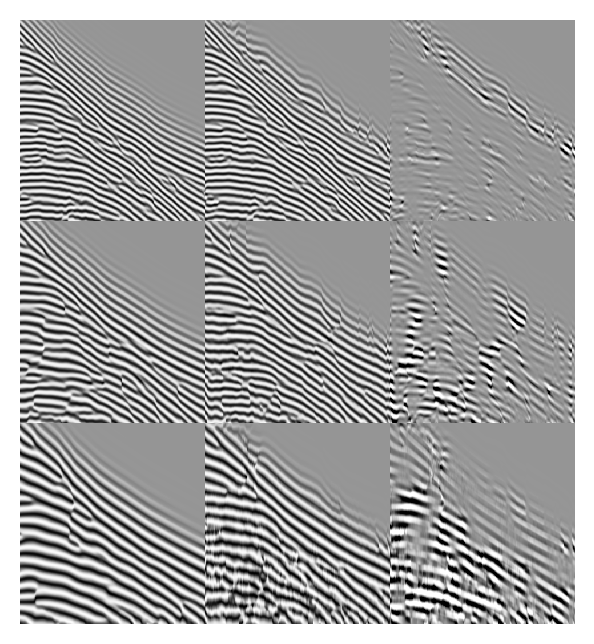

In [20]:
vis.plot_nxm(agcs, pclip=0.5, colorbar=False, dpi=200)

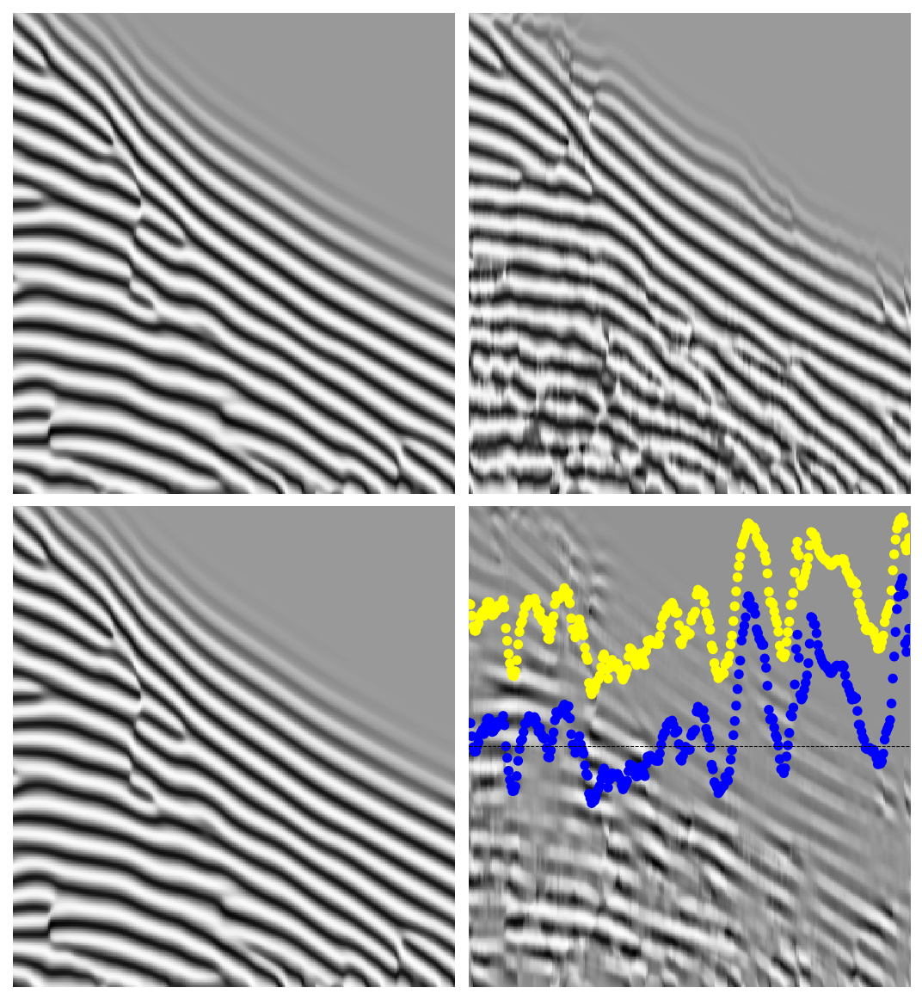

In [21]:
vis.imgrid(agcs[-1][0], agcs[-1][0], [agcs[-1][1]], diff_of_diff=False, figsize=(9, 10), scatter_size=30)

# Mean errors through entire dataset

In [22]:
for_mean_true = []
for_mean_pred = []

this_fhi = 3
for i in range(data_p.shape[0]):
    for_mean_true.append(np.expand_dims(ld.bandpass(data_p[i, :, :], fs=1/dt, fhi=this_fhi, btype='low', order=8), 0))
    for_mean_pred.append(np.expand_dims(ld.bandpass(data_blend[i, : :], fs=1/dt, fhi=this_fhi, btype='low', order=8), 0))
for_mean_true = np.concatenate(for_mean_true, 0)
for_mean_pred = np.concatenate(for_mean_pred, 0)
print(for_mean_true.shape, for_mean_pred.shape)

(80, 324, 3000) (80, 324, 3000)


In [23]:
mean_true = np.mean(for_mean_true, 0)[..., crop_bottom*4:-crop_bottom*8]
mean_pred = np.mean(for_mean_pred, 0)[..., crop_bottom*4:-crop_bottom*8]
std_true = np.std(for_mean_true, 0)[..., crop_bottom*8:-crop_bottom*8]
std_pred = np.std(for_mean_pred, 0)[..., crop_bottom*8:-crop_bottom*8]

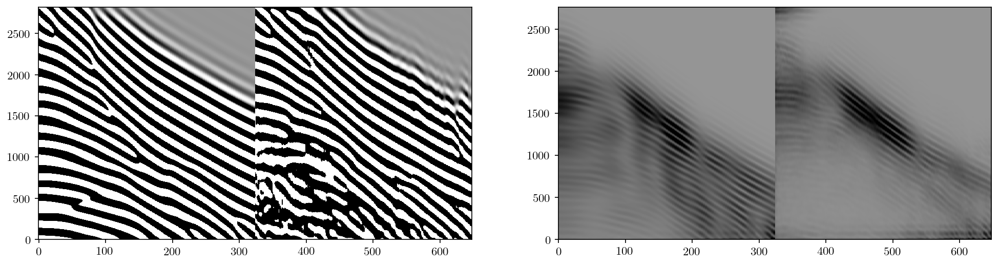

In [24]:
fig, ax = plt.subplots(1,2, figsize=(16, 4))
vis.plot_shot([mean_true, mean_pred], pclip=0.0001, colorbar=False, ax=ax[0], axis='off', dpi=200)
vis.plot_shot([std_true, std_pred], pclip=0.75, colorbar=False, ax=ax[1], dpi=200)

In [25]:
mean_rms = np.sqrt(np.sum((for_mean_true - for_mean_pred)**2)) / np.sqrt(np.sum((for_mean_true)**2))
print(mean_rms)

0.7362800042240256


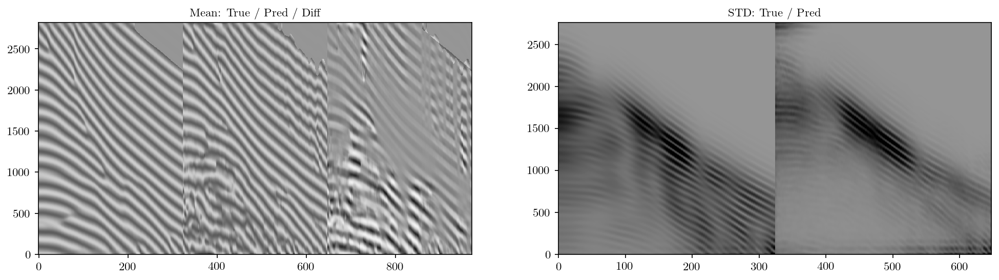

In [26]:
fig, ax = plt.subplots(1,2, figsize=(16, 4))
mean_true_a = vis.agc(mean_true, **par_agc)[0]
mean_pred_a = vis.agc(mean_pred, **par_agc)[0]
vis.plot_shot([mean_true_a, mean_pred_a, mean_true_a - mean_pred_a], pclip=0.9, colorbar=False, ax=ax[0], 
              axis='off', dpi=200, title='Mean: True / Pred / Diff')
vis.plot_shot([std_true, std_pred], pclip=0.75, colorbar=False, ax=ax[1], dpi=200, title='STD: True / Pred')

# Compare data from true foldler and low folder

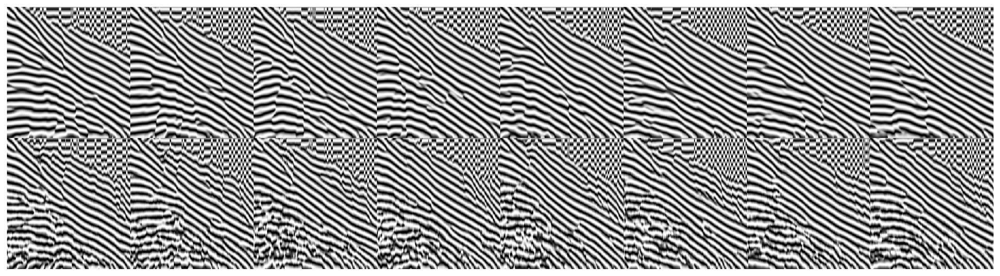

In [27]:
par_blend_ulow_low ={'fs': 1/dt, 'upscale': 8, 'pad': (0, 8), 'fhi': 3, 'btype': 'low', 'order': 8}

tops, bottoms = [], []
for i in range(0, data_p.shape[0], 10):
    dtrue = data_p[i, ...]
    dblend = data_blend[i, ...]
    
    # Bandpass and AGC of true data
    tmp_true = ld.bandpass(dtrue, **par_blend_ulow_low)
    tmp_true = vis.agc(tmp_true, **par_agc)[0][..., ::8]
    tops.append(tmp_true[..., crop_bottom:-crop_bottom])
    
    # Bandpass and AGC of predicted data
    tmp_blend = ld.bandpass(dblend, **par_blend_ulow_low)
    tmp_blend = vis.agc(tmp_blend, **par_agc)[0][..., ::8]
    bottoms.append(tmp_blend[..., crop_bottom:-crop_bottom])
    
vis.plot_nxm([tops, bottoms] ,figsize = (5* len(tops), 5), 
             colorbar=False, pclip=0.75)

In [28]:
 path_syn = os.path.join(root_data, 'test_syn/')
jloader_tr, jloader_te = sd.init_loaders(
                 root_src = path_syn,
                 root_dst = os.path.join(root_data, 'field_samples/'))

path_syn = os.path.join(root_data, 'test_field/')
jfloader_tr, jfloader_te = sd.init_loaders(
                 root_src = path_syn,
                 root_dst = os.path.join(root_data, 'field_samples/'))

Load cubes from ./pretrained_files/data/test_syn/...
(87, 324, 376) (87, 324, 376) (87, 324, 376) (87, 324, 376)
(5, 324, 376) (5, 324, 376) (5, 324, 376) (5, 324, 376)
(64, 324, 376) (64, 324, 376) (64, 324, 376) (64, 324, 376)
(64, 324, 376) (64, 324, 376) (64, 324, 376) (64, 324, 376)
Processed data loaders: 87 64
Load cubes from ./pretrained_files/data/test_field/...
(87, 324, 376) (87, 324, 376) (87, 324, 376) (87, 324, 376)
(5, 324, 376) (5, 324, 376) (5, 324, 376) (5, 324, 376)
(64, 324, 376) (64, 324, 376) (64, 324, 376) (64, 324, 376)
(64, 324, 376) (64, 324, 376) (64, 324, 376) (64, 324, 376)
Processed data loaders: 87 64


In [29]:
path_noise = os.path.join(root_data, 'noise_donors')
cube_hf = ld.make_noise_cube(os.path.join(path_noise, 'cube_dst_te_h.npy'))

jloader_tr = ld.NoiseAdder(jloader_tr, cube_hf)
jloader_te = ld.NoiseAdder(jloader_te, cube_hf)

jfloader_tr = ld.NoiseAdder(jfloader_tr, cube_hf)
jfloader_te = ld.NoiseAdder(jfloader_te, cube_hf)

Load ./pretrained_files/data/noise_donors/cube_dst_te_h.npy
(80, 324, 376)
(80, 324, 446)


8 (324, 376)
src:	(324, 376)


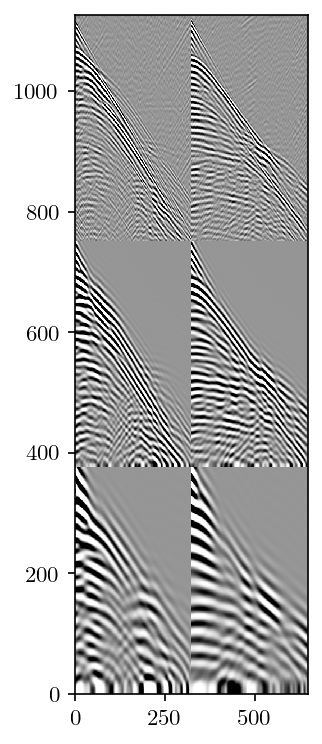

In [30]:
# importlib.reload(vis)
d = jloader_te.__getitem__(0)
hs, ls, us, mods, hf, lf, uf, modf = [v[0,...] for v in d]

print(len(d), hs.shape)
no, nt = hs.shape[-2:]
yax = np.arange(nt) * dt
print(f"src:\t{hs.shape}")
titles = ['High', 'Low', 'Mid']
ax = vis.plot_shot(np.concatenate([np.concatenate([hs, hf], 0),
                                  np.concatenate([ls, lf], 0),
                                  np.concatenate([us, uf], 0)], 1), 
                   colorbar=False, figsize=(2,6), 
                   pclip=0.1);

# Curves

In [31]:
# Get an ensemble
net = nets[-1]
curves_lr = []
curves_data = []
curves_encoder = []

if isinstance(net, Blend):
    net = net.ens[-1]
    
for subnet in net.nets:
    curves_lr.append(subnet.running_metrics_lr)
    curves_data.append(subnet.running_metrics_data)
    curves_encoder.append(subnet.running_metrics_encoder)

In [32]:
# Learning rates
print(list(curves_lr[0].keys()), list(curves_lr[0]['train'].keys()))
n_epochs = len(curves_lr[0]['train']['lr_data'])

['train'] ['lr_data', 'lr_model']


In [33]:
# Loss weights
print(list(curves_data[0].keys()), list(curves_data[0]['train'].keys()))

['train'] ['w1', 'w2', 'w3', 'w_s1s2s3']


In [34]:
# Losses
print(list(curves_encoder[0].keys()), list(curves_encoder[0]['train'].keys()))

['train', 'val'] ['data', 'model', 'corr']


### Loss terms

In [35]:
# skip_first = int(0.1 * n_epochs)
skip_first = 0

ctr_data, ctr_model, ctr_corr, cte_data, cte_model, cte_corr = [], [], [], [], [], []
for curve in curves_encoder:
    ctr_data.append(curve['train']['data'][skip_first:])
    ctr_model.append(curve['train']['model'][skip_first:])
    cte_data.append(curve['val']['data'][skip_first:])
    cte_model.append(curve['val']['model'][skip_first:])
    try:
        ctr_corr.append(curve['train']['corr'][skip_first:])
        cte_corr.append(curve['val']['corr'][skip_first:])
    except:
        print('Failed to get corr loss')

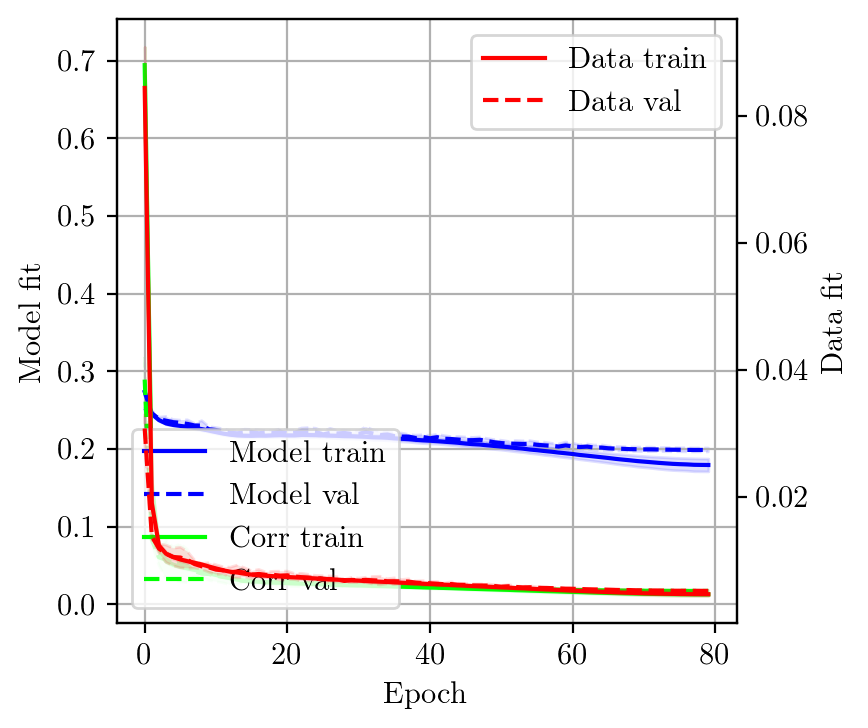

In [36]:
mpl.rcParams['figure.dpi']= 200
def get_xax_min_max_mean(lst_data):
#     print(f'Process list of {len(lst_data)}')
    min_len = min([len(x) for x in lst_data])
    dat = np.concatenate([np.array(x)[np.newaxis, :min_len] for x in lst_data], 0)
#     cmin = np.min(dat, 0)
#     cmax = np.max(dat, 0)
    cstd = np.std(dat, 0)
    cmean = np.mean(dat, 0)
    cmax = cmean + cstd
    cmin = cmean - cstd
    xax = skip_first + np.arange(len(cmean))
    return xax, cmin, cmax, cmean

def plot_fillbetween(ax, lst_data, **kwargs):
    xax, cmin, cmax, cmean = get_xax_min_max_mean(lst_data)
    ax.fill_between(xax, cmin, cmax, alpha=0.125, **kwargs)
    ax.plot(xax, cmean, **kwargs)
    
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
subaxis = [ax, ax.twinx()]
plot_fillbetween(subaxis[0], ctr_model, color='b')
plot_fillbetween(subaxis[0], cte_model, color='b', linestyle='--')
plot_fillbetween(subaxis[1], ctr_data, color='r')
plot_fillbetween(subaxis[1], cte_data, color='r', linestyle='--')
try:
    plot_fillbetween(subaxis[0], ctr_corr, color='lime')
    plot_fillbetween(subaxis[0], cte_corr, color='lime', linestyle='--')
except:
    print('Failed to plot corr loss')

subaxis[0].set_ylabel('Model fit')
subaxis[1].set_ylabel('Data fit')
subaxis[0].legend(['Model train', 'Model val', 'Corr train', 'Corr val'], loc=3)
subaxis[1].legend(['Data train', 'Data val'], loc=1)
ax.set_xlabel('Epoch')
ax.grid()
# ax.set_title('Loss curves')

# vis.savefig('losses.png', disable=DISABLE_SAVEFIG)

### Normalize to percentage

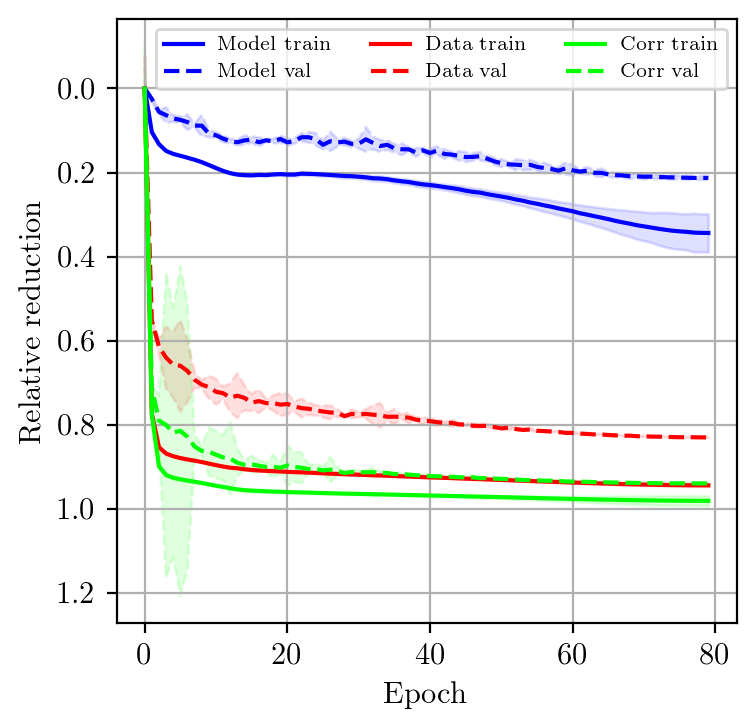

In [37]:
mpl.rcParams['figure.dpi']= 200

mpl.rcParams.update({'legend.fontsize': 7})
def get_xax_min_max_mean_relative(lst_data):
    min_len = min([len(x) for x in lst_data])
    dat = np.concatenate([np.array(x)[np.newaxis, :min_len] for x in lst_data], 0)
    
    # Standard deviation
    cstd = np.std(dat, 0)
    cstd_max, cstd_min = np.max(cstd), np.min(cstd)
    
    # Mean
    cmean = np.mean(dat, 0)
    cmean_max, cmean_min = np.max(cmean[:5]), np.min(cmean)
    
    # Std relative to mean
    std_relative = cstd / cmean
    
    relative_drop = (cmean_max - cmean_min)/ cmean_max
    cmean -= cmean_min
    cmean /= cmean[:5].max()
    cmean = 1 - cmean
    cmean *=relative_drop
    cmax = cmean + cstd / np.max(cstd) * std_relative
    cmin = cmean - cstd / np.max(cstd) * std_relative
    xax = skip_first + np.arange(len(cmean))
    return xax, cmin, cmax, cmean

def plot_fillbetween_relative(ax, lst_data, **kwargs):
    xax, cmin, cmax, cmean = get_xax_min_max_mean_relative(lst_data)
    ax.fill_between(xax, cmin, cmax, alpha=0.125, **kwargs)
    ax.plot(xax, cmean, **kwargs)

# Plotting starts here
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
plot_fillbetween_relative(ax, ctr_model, color='b')
plot_fillbetween_relative(ax, cte_model, color='b', linestyle='--')
plot_fillbetween_relative(ax, ctr_data, color='r')
plot_fillbetween_relative(ax, cte_data, color='r', linestyle='--')
try:
    plot_fillbetween_relative(ax, ctr_corr, color='lime')
    plot_fillbetween_relative(ax, cte_corr, color='lime', linestyle='--')
except:
    print('Failed to plot corr loss')

ax.set_ylabel('Relative reduction')
ax.legend(['Model train', 'Model val', 'Data train', 'Data val',  'Corr train', 'Corr val'], loc=1, ncol=3)
ax.set_xlabel('Epoch')
ax.grid()
ax.invert_yaxis()
# ax.set_ylim([0.4, -0.05])
# ax.set_xlim([0, 80])
# ax.set_title('Loss curves')

### Loss weights

In [38]:
skip_first = 0
ctr_w1, ctr_w2, ctr_w3, ctr_w1w2w3 = [], [], [], []
for curve in curves_data:
    ctr_w1.append(curve['train']['w1'][skip_first:])
    ctr_w2.append(curve['train']['w2'][skip_first:])
    ctr_w3.append(curve['train']['w3'][skip_first:])
    ctr_w1w2w3.append(curve['train']['w_s1s2s3'][skip_first:])

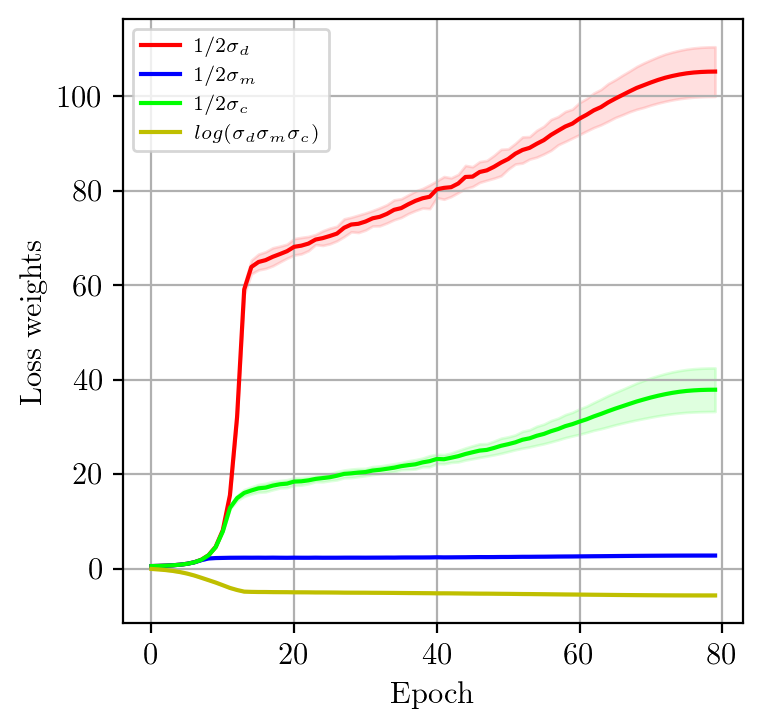

In [39]:
def scale_nested_list(lst, k):
    return [[k * v for v in l] for l in lst]

fig, ax = plt.subplots(1, 1, figsize=(4, 4))
plot_fillbetween(ax, ctr_w1, color='r')
plot_fillbetween(ax, scale_nested_list(ctr_w2, 1), color='b')
plot_fillbetween(ax, scale_nested_list(ctr_w3, 1), color='lime')
plot_fillbetween(ax, ctr_w1w2w3, color='y')
ax.set_ylabel('Loss weights')
ax.legend([r'$1/2\sigma_d$', 
           r'$1/2\sigma_m$', 
           r'$1/2\sigma_c$', 
           r'$log(\sigma_d\sigma_m\sigma_c)$'], loc=2)
ax.set_xlabel('Epoch')
ax.grid()
# ax.set_yscale('log')
# ax.set_title()

### Learning rate

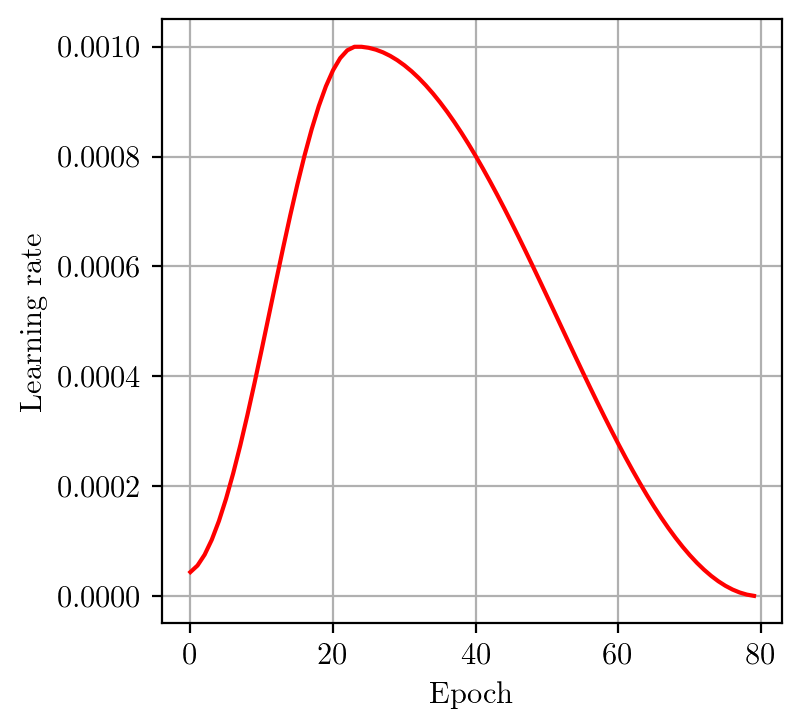

In [40]:
curve = curves_lr[0]['train']['lr_data']
    
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
ax.plot(np.arange(len(curve)), curve, color='r')
ax.set_ylabel('Learning rate')
ax.set_xlabel('Epoch')
ax.grid()

In [41]:
params['text.usetex'] = False
mpl.rcParams.update(params)

# Images

# Match shot amplitudes

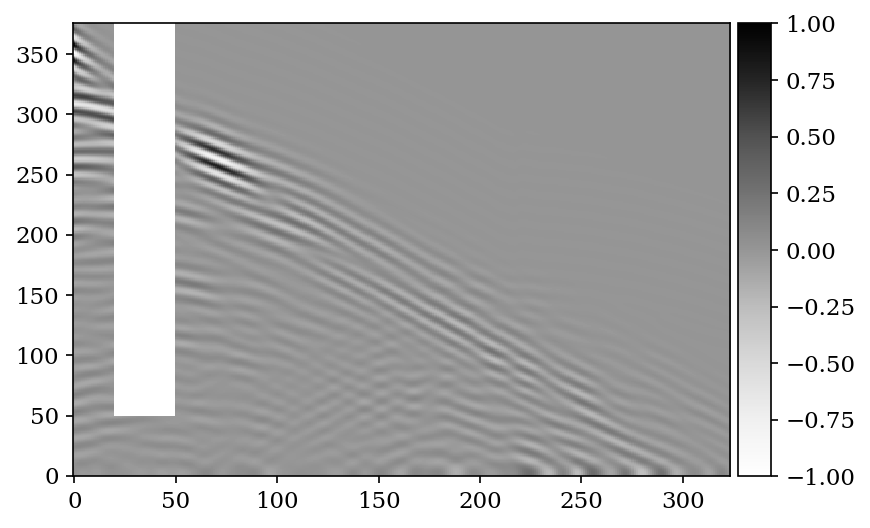

In [42]:
def match_amp(have, want):
    max_have = np.max(have[20:50,:-50])
    max_want = np.max(want[20:50,:-50])
    return have / max_have * max_want

d = jfloader_te.__getitem__(0)
hst, lst, ust, modst, hft, lft, uft, modft = [v[0,...] for v in d]
_lst = lst.copy()
_lst[20:50, :-50] = -1
vis.plot_shot(_lst)

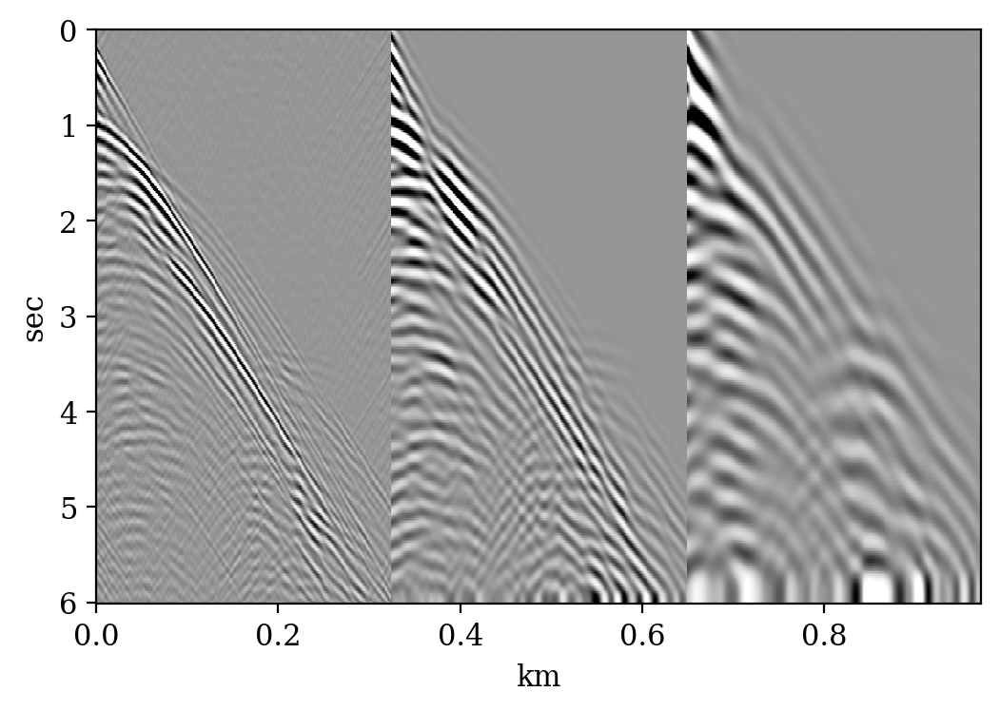

In [43]:
vis.plot_shot([hst[..., ], lst, ust], pclip=0.25, colorbar=False, dt=dt_net, dx=1, dpi=200)

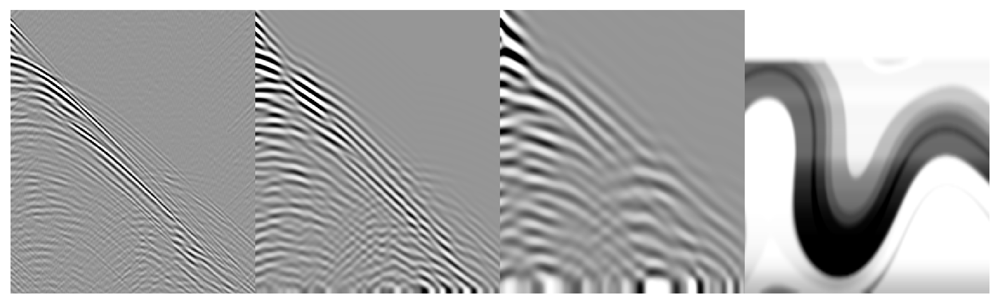

In [44]:
# vis.plot_model(np.flip(modst, -1).T, colorbar=False, axis=False, dpi=200)
pclip=0.25; vis.plot_shot([hst, lst, ust, modst*pclip], pclip=pclip, figsize=(12, 4), axis=False, colorbar=False, dpi=200)

In [69]:
from skimage import metrics

def r2(lbl, pred, dim):
    """Trace-wise R2 score"""
    top = np.sum((lbl - pred) ** 2, axis=-1, keepdims=True)
    bottom = np.sum((lbl - np.mean(lbl, axis=-1, keepdims=True)) ** 2, -1, keepdims=True)
    return 1 - (top / bottom)


def struct_similarity(lbl, pred):
    """SSIM"""
    win = int(0.1 * lbl.shape[-2])
    if win % 2 == 0:
        win += 1
    ssims = []
    for ip in range(pred.shape[0]):
        ssims.append(metrics.structural_similarity(lbl[ip,...], pred[ip,...], gaussian_weights=False, win_size=win))
    return np.array(ssims)


def print_stats(lbls, preds, titles):
    dct = {'title': [], 
           'r2': [],
           'ssim': [],
           'pear': [], 
          }
    
    # ==========================
    print('Calculating Mean. Wait', end='')
    for title, lbl, pred in zip(titles, lbls, preds):
        print('.', end='')
        dct['title'].append(title)
        # Mean
        dct['r2'].append(np.mean(r2(lbl, pred, -1)))
        dct['ssim'].append(np.mean(struct_similarity(lbl, pred)))
        dct['pear'].append(np.mean(vis.pearsonr(lbl, pred, -1)))
   
    df = pd.DataFrame.from_dict(dct, )
    tmp = df.select_dtypes(include=[np.number])
    df.loc[:, tmp.columns] = np.round(tmp, 2)
    print('\n')
    print(df)
    print('\n')
    
    # ==========================
    print('Calculating STD. Wait', end='')
    dct['r2'] = []
    dct['ssim'] = []
    dct['pear'] = []
    for title, lbl, pred in zip(titles, lbls, preds):
        print('.', end='')
        # STD
        dct['r2'].append(np.std(r2(lbl, pred, -1)))
        dct['ssim'].append(np.std(struct_similarity(lbl, pred)))
        dct['pear'].append(np.std(vis.pearsonr(lbl, pred, -1)))
   
    df = pd.DataFrame.from_dict(dct, )
    tmp = df.select_dtypes(include=[np.number])
    df.loc[:, tmp.columns] = np.round(tmp, 2)
    print('\n')
    print(df)

### Make trable from paper

In [70]:
print(net_titles)

['True', 'unet_l', 'l', 'lc', 'lcm']


In [71]:
crop_t = 10 # crop first and last pixels along time where bandpass filtering artifacts are
_net_lbls = [p[..., ::8] for p in net_lbls]
_net_preds = [p[..., ::8] for p in net_preds]
_net_preds = [match_amp(p, l) for p, l in zip(_net_preds, _net_lbls)]

print_stats([p[..., crop_t:-crop_t] for p in _net_lbls], 
            [p[..., crop_t:-crop_t] for p in _net_preds], 
            net_titles)

Calculating Mean. Wait....

    title    r2  ssim  pear
0    True  0.38  0.79  0.63
1  unet_l  0.44  0.81  0.69
2       l  0.44  0.81  0.68
3      lc  0.44  0.81  0.69


Calculating STD. Wait....

    title    r2  ssim  pear
0    True  0.25  0.02  0.25
1  unet_l  0.24  0.02  0.23
2       l  0.26  0.02  0.25
3      lc  0.25  0.02  0.23


In [77]:
def print_title_score(tts, scrs):
    print('\n'.join([str(t).ljust(10) + f'\t{v}' for (t, v) in zip(tts, scrs)]))

    
# BANDPASS
par_bp = copy.copy(sd.par_default['rules']['ulow']); 
par_bp['fhi'] = 3
par_bp['fs'] = 1/dt_net;
par_bp['upscale'] = 8
par_bp['pad'] = (0, 8)
print(par_bp)

vlim_low = {'vmin': -0.1, 'vmax': 0.1}
vlim_ulow = {'vmin': -0.005, 'vmax': 0.005}

imid = 1

def insert_true_to_preds(index, channel, _preds, fns, modst, lft, uft, _titles, _colors):
    if index == 1:
        _preds.insert(0, fns[0][0](modst)[::4,::4])
    else:
        if channel == 1:
            print('Insert low')
            _preds.insert(0, fns[0][0](lft))
        else:
            print('Insert ultra-low')
            _preds.insert(0, fns[0][0](uft))
    if 'True' not in titles:
        _titles.insert(0, 'True')
        _colors.insert(0, 'k--')
    return _preds, _titles, _colors

def img_for_all_nets(nets, titles, colors, loader, imid, index, channel):
    d = loader.__getitem__(imid)
    hst, lst, ust, modst, hft, lft, uft, modft = [v[0,...] for v in d]

    preds_raw = [fns[inet][-1](net.predict(fns[inet][0](hft), index, channel, return_type='list')) for inet, net in enumerate(nets)]
    preds_raw = [[resize(p, (324, 376)) for p in sublist] for sublist in preds_raw]
    print('Raw prediction list length (should be all the same:\n\t{})'.format([len(p) for p in preds_raw]))
    preds_list = [[np.expand_dims(p, 0) for p in sublist] for sublist in preds_raw]
    preds_list_bp = [[np.expand_dims(ld.bandpass(p, **par_bp), 0) for p in sublist] for sublist in preds_raw]

    # Mean prediction
    preds = [np.mean(np.concatenate(p, 0), 0) for p in preds_list]
    preds_bp = [np.mean(np.concatenate(p, 0), 0) for p in preds_list_bp]
    # Std of predictions
    preds_std = [np.std(np.concatenate(p, 0), 0) for p in preds_list]
    preds_std_bp = [np.std(np.concatenate(p, 0), 0) for p in preds_list_bp]
    
    par_table_field = vlim_low if index == 0 else {'vmin': None, 'vmax': None}
    par_table_field2 = vlim_ulow if index == 0 else {'vmin': None, 'vmax': None}

    if len(preds) == len(nets):
        preds, titles, colors = insert_true_to_preds(index, channel, preds, fns, modst, lft, uft, titles, colors)
        preds_bp.insert(0, ld.bandpass(preds[0], **par_bp))
        preds_std.insert(0, np.zeros_like(lft))
        preds_std_bp.insert(0, np.zeros_like(lft))

    preds = tuple(preds)
    preds_bp = tuple(preds_bp)

    preds = [p[..., 10:-10] for p in preds]
    preds_bp = [p[..., 10:-10] for p in preds_bp]
    preds_std_bp = [p[..., 10:-10] for p in preds_std_bp]
    
    # PLOT
    diffs = [preds[0] - p for p in copy.copy(preds)];    
    diffs = [preds_bp[0] - p for p in copy.copy(preds_bp)];# print([vis.relative_rms(preds[0], p) for p in diffs])
   
    # Row-plots
    vis.plot_nxm([preds], figsize=(2*len(preds_bp), 2),  colorbar=False, **par_table_field)
    vis.plot_nxm([preds_bp], figsize=(2*len(preds_bp), 2),  colorbar=False, **par_table_field2)
    print(preds[0].shape, preds_bp[0].shape)
    
    # STD
    vis.plot_nxm([preds_std], figsize=(2*len(preds_std), 2),  colorbar=False, cmap='magma', vmin=0, pclip=0.35)
    vis.plot_nxm([preds_std_bp], figsize=(2*len(preds_std_bp), 2),  colorbar=False, cmap='magma', vmin=0, pclip=0.35)
    
    # =================
    # COMPARE SELECTED    
    # =================
    cid1, cid2 = 2, -1
    print(titles[cid1], titles[cid2])
    vis.imgrid(match_amp(preds[0], hft), preds[0], (preds[cid1], preds[cid2]), 
               diff_of_diff=True, scatter_size=4, figsize=(6, 3.5), **par_table_field)
    
    vis.imgrid(match_amp(preds_bp[0], hft), preds_bp[0], (preds_bp[cid1], preds_bp[cid2]), 
               diff_of_diff=True, scatter_size=4, figsize=(6, 3.5), **par_table_field2)
    
    print(titles)
    return preds, preds_bp, titles, colors

{'fhi': 3, 'btype': 'low', 'order': 8, 'fs': 62.5, 'upscale': 8, 'pad': (0, 8)}


### Synthetic data

Raw prediction list length (should be all the same:
	[10, 10, 10, 10])
Insert low
(324, 356) (324, 356)
l lcm
['True', 'unet_l', 'l', 'lc', 'lcm']


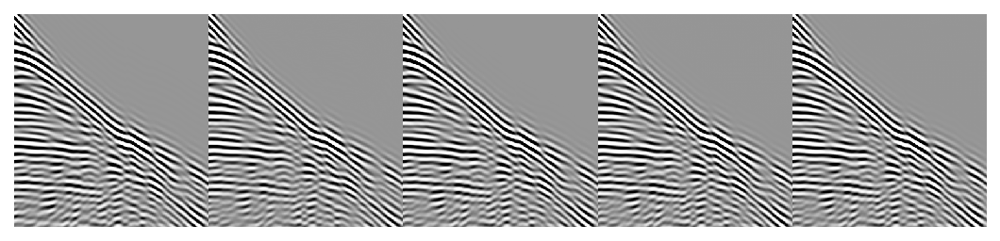

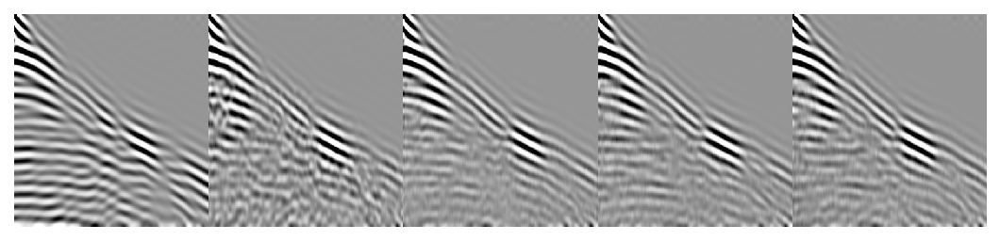

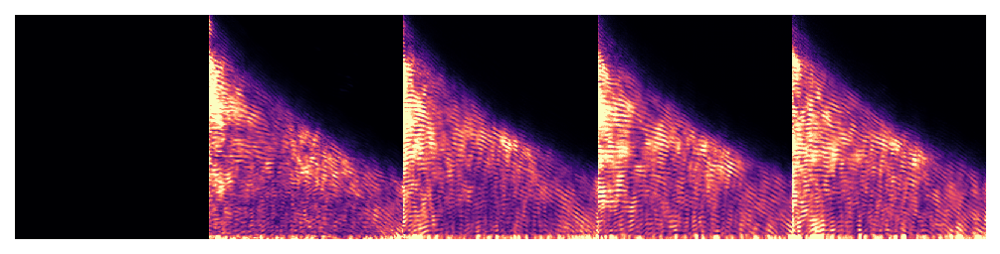

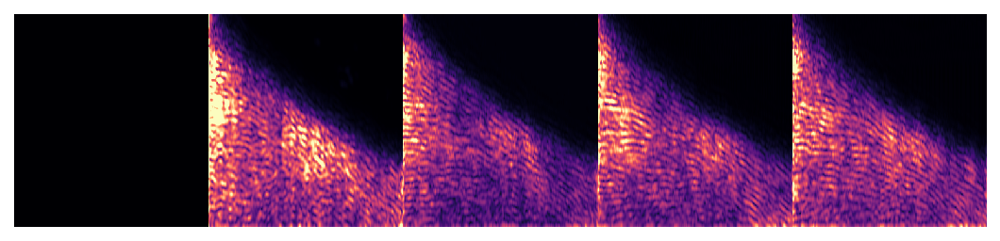

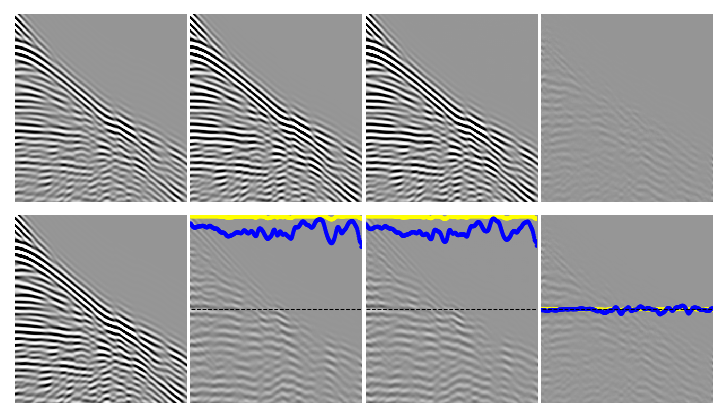

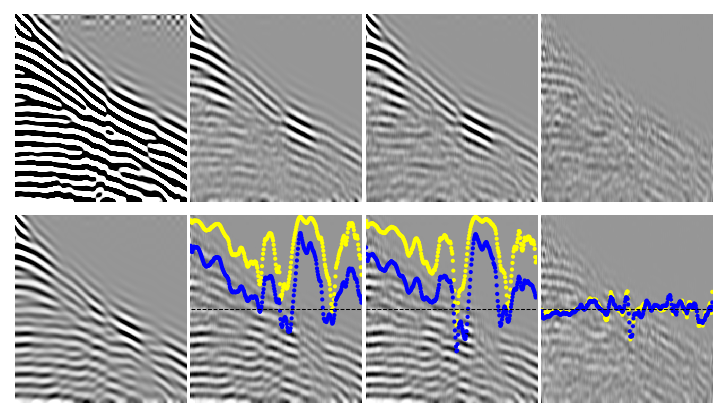

In [78]:
mpl.rcParams['figure.dpi']= 150
preds, preds_bp, titles, colors = img_for_all_nets(nets, net_titles, net_colors, jloader_te, imid, 0, 1)

# Table 3x2: input, low, ulow + 3 predictions

In [79]:
import matplotlib.gridspec as gridspec

def make_pic_3x2(nets, inet, title, loader, imid):
    d = loader.__getitem__(imid)
    hst, lst, ust, modst, hft, lft, uft, modft = [v[0,...] for v in d]

    preds = [fns[inet][-1](nets[inet].predict(fns[inet][0](hft), index, channel)) 
             for index, channel in [(0,0), (0,1), (1,0)]]
    up, lp, mp = preds

    lp_bp = ld.bandpass(lp, **par_bp)
    
    fsize = 2
    nz, nx = 3, 2
    plt.figure(figsize=(0.84*nx*fsize, nz*fsize))
    gs1 = gridspec.GridSpec(nz, nx)
    gs1.update(wspace=0.01, hspace=0.01) # set the spacing between axes. 

#     fig, ax = plt.subplots(nz, nx, figsize=(nx*fsize, nz*fsize))
    ax = plt.subplot(gs1[0])
    vis.plot_shot(hft, ax=ax, pclip=0.25, axis=False, colorbar=False)
    
    ax = plt.subplot(gs1[1])
#     vis.plot_shot(iscale_vel(mp), ax=ax, pclip=1, cmap='RdBu_r', colorbar=True, axis=False, vmin=None, vmax=None)
    vis.plot_shot(mp, ax=ax, pclip=0.25, cmap='RdBu_r', colorbar=False, axis=False, vmin=None, vmax=None)
    
    ax = plt.subplot(gs1[2])
    vis.plot_shot(lft, ax=ax, pclip=0.25, axis=False, colorbar=False)
    
    ax = plt.subplot(gs1[3])
    vis.plot_shot(lp, ax=ax, pclip=0.25,  axis=False, colorbar=False)
    
    ax = plt.subplot(gs1[4])
    vis.plot_shot(uft, ax=ax, pclip=0.25,  axis=False, colorbar=False)
    
    ax = plt.subplot(gs1[5])
    vis.plot_shot(lp_bp, ax=ax, pclip=0.02,  axis=False, colorbar=False)

In [80]:
net_id = -1

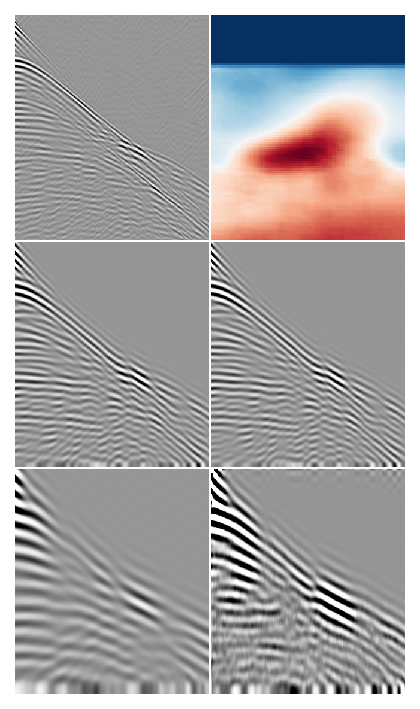

In [81]:
make_pic_3x2(nets, net_id, '', jloader_te, imid)

# Neural network interpretation

Total 336 kernels in branch EB1: [8, 16, 16, 32, 32, 32, 32, 32, 32, 32, 32, 32]
Total 336 kernels in branch EB2: [8, 16, 16, 32, 32, 32, 32, 32, 32, 32, 32, 32]
Total 336 kernels in branch EB3: [8, 16, 16, 32, 32, 32, 32, 32, 32, 32, 32, 32]


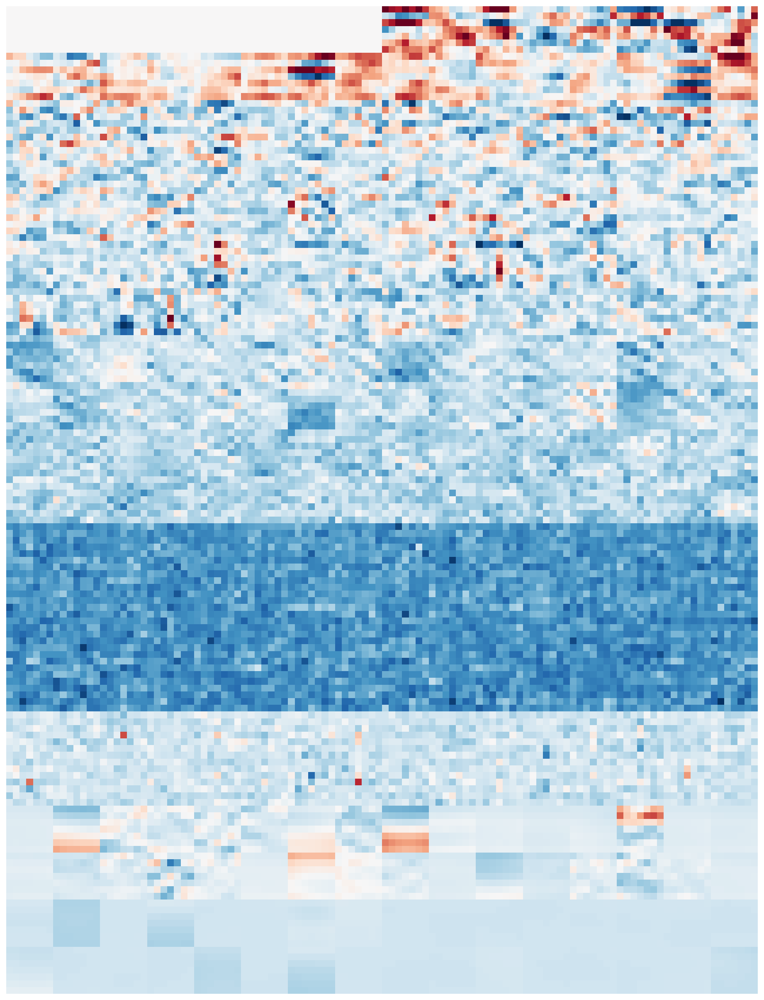

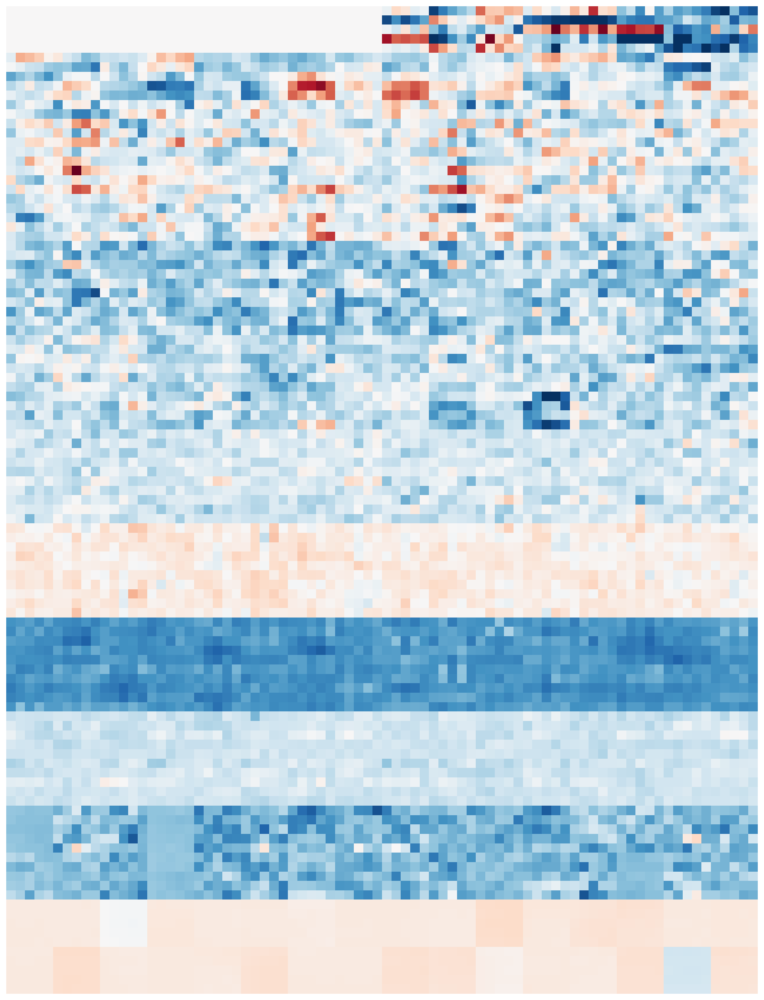

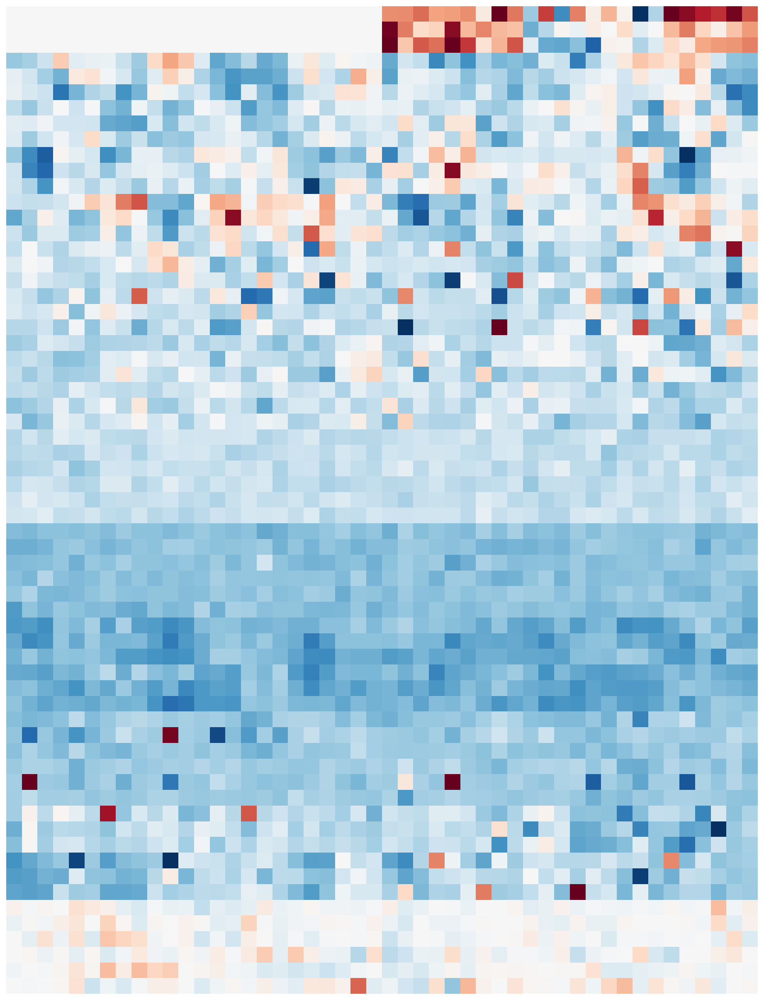

In [53]:
net = nets[-1].nets[0]
for branch_name in ['EB1', 'EB2', 'EB3']:
    all_kernels = []
    num_kernels_per_layer = []
    for this_layer in getattr(net.net_encoder, branch_name):
        kernels = this_layer.weight.cpu().detach().clone()
        kernels = kernels - kernels.min()
        kernels = kernels / kernels.max()
        kernels = kernels[:, 0:1, ...].squeeze()
        all_kernels.append(kernels)
        num_kernels_per_layer.append(kernels.shape[0])
    all_kernels = np.concatenate(all_kernels, 0)
    all_kernels = np.concatenate([0.5 * np.ones((8, *all_kernels.shape[-2:])), all_kernels], 0)
    print(f'Total {all_kernels.shape[0]} kernels in branch {branch_name}: {num_kernels_per_layer}')
    vis.plot_data3d_slices(all_kernels, 
                           cmap='RdBu_r', 
#                            cmap='turbo',
                           ncols=16, vmin=0.1, vmax=0.9)

In [54]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from natsort import natsorted

class NewModel(nn.Module):
    def __init__(self, pretrained, branch: str = 'EB1', sublayer_id: int = 3):
        super().__init__()
        self.branches = list(pretrained.net_encoder._modules.keys())
        assert branch in self.branches, f"Branch should be in {self.branches}"
        
        self.layers = pretrained.net_encoder._modules.get(branch)
        
        self.using_norm = True
        self.norm = F.instance_norm
        self.act = F.elu
        self.pads = pretrained.net_encoder._modules.get('pads')
        if branch == 'EB1':
            self.pad_rec = [3, 3, 3, 3, 3, 3, 6, 12, 24, 48, 3, 3, 0]
        elif branch == 'EB2':
            self.pad_rec = [2, 2, 2, 2, 2, 2, 4, 8, 16, 32, 2, 2, 0, 2, 2, 0]
        elif branch == 'EB3':
            self.pad_rec = [1, 1, 1, 1, 1, 1, 2, 4, 8, 16, 1, 1, 0, 1, 1, 0, 1, 1]
        
        selected_layers = []
        for ilayer, layer in enumerate(self.layers):
            if ilayer != sublayer_id:
                selected_layers.append(layer)
            else:
                break
        
        self.net = nn.ModuleList(selected_layers)

    def forward(self, x):
        for i, layer in enumerate(self.net):
            pad_idx = self.pad_rec[i]
            x = layer(self.pads[pad_idx](x))
            if self.using_norm:
                x = self.norm(x)
            if pad_idx != 0:
                x = self.act(x)
        return x

# model_chunk = NewModel(net, branch='EB1', sublayer_id=11)
# from torchsummary import summary
# summary(model_chunk, (1, 324, 376))

In [55]:
def get_filter_activation(model, input_shape, filter_id, niter=100, lr_min=1e-2, lr_max=1):
    random_image = np.random.uniform(-0.5, 0.5, input_shape).astype(np.float32)

    processed_image = torch.tensor(random_image).unsqueeze(0).to(0)
    processed_image.requires_grad_(True)

    optimizer = torch.optim.Adam([processed_image], lr=lr_min, betas=(0.5, 0.9), weight_decay=1e-5)
    
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, 
                                                        max_lr=lr_max,
                                                        cycle_momentum=False,
                                                        epochs=niter,
                                                        steps_per_epoch=1)
    prog_bar = range(1, niter)
    loss_curve = []
    for i in prog_bar:
        optimizer.zero_grad()
        x = processed_image
        x = model(x)

        conv_output = x[0, filter_id]
        loss = -torch.mean(conv_output)
        loss_curve.append(loss.sum().item())
        loss.backward()
        optimizer.step()
        scheduler.step()
        
    return processed_image.cpu().detach().numpy()[0,0,...]

In [56]:
imgs = []
for layer_id in range(1, 12, 4):
    imgs_layer = []
    for branch in ['EB1', 'EB2', 'EB3']:
        model_chunk = NewModel(net, branch=branch, sublayer_id=layer_id)
        for filter_id in range(1, 8, 2):
            print(f'Branch: {branch}\tLayer: {layer_id}\tFilter: {filter_id}', end='\r')
            imgs_layer.append(get_filter_activation(model_chunk, d[0].shape, filter_id, 
                                                    niter=500,
                                                   lr_min=1e-5,
                                                   lr_max =1e-1))
    imgs.append(imgs_layer)
print('\nDone.')

Branch: EB3	Layer: 9	Filter: 7
Done.


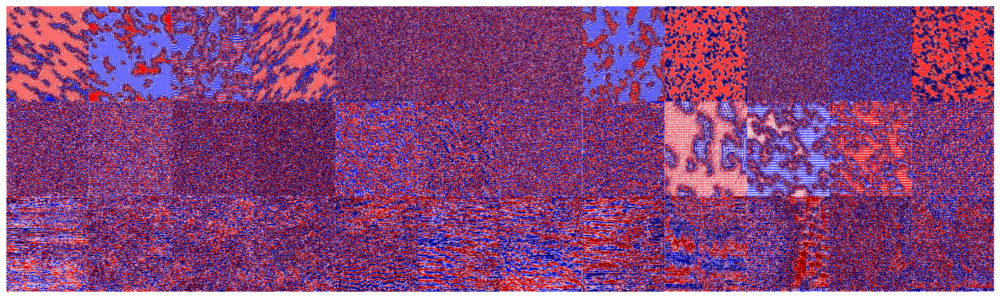

In [57]:
# importlib.reload(vis)
vis.plot_nxm(imgs, transpose=False, pclip=0.125,
             cmap='seismic', colorbar=False, 
             figsize=(2*len(imgs[0]), 2*len(imgs)))

# Velocity model!!!

In [58]:
every_nth_shot = 20

p = f'{root_su}*.shot*'
fnames = natsorted(glob.glob(p))
fnames = [f for f in fnames if '.it' not in f]
print(f'{len(fnames)} files found in {p}')

80 files found in ./pretrained_files/data/test_syn/su/*.shot*


In [59]:
cube_cgg = []
for i, f in enumerate(fnames):
    clear_output()
    print(f'{i+1}/{len(fnames)}\n{f}')
    with segyio.su.open(f, "r+", endian='little', ignore_geometry=True) as dst:
        raw = dst.trace.raw[:]
        print(raw.shape)
        cube_cgg.append(np.expand_dims(raw, 0))

cube_cgg = np.concatenate(cube_cgg, 0)
(cube_cgg_h, cube_cgg_l, cube_cgg_u),scalers =  sd.split_hlm(cube_cgg, sd.par_default)
loader_cgg = sd.TriLoader(cube_cgg_h, cube_cgg_l, cube_cgg_u, np.zeros_like(cube_cgg_u), sd.par_default)

80/80
./pretrained_files/data/test_syn/su/seis_p.su.shot80
(324, 3000)
Start split for (80, 324, 3000)
Start making cubes from lists for list 80, where each sublist 3
(80, 324, 376)
(80, 324, 376)
(80, 324, 376)
(80, 324, 376) (80, 324, 376) (80, 324, 376) (80, 324, 376)


Create a list `[(nshots, noffsets, ntimes)... for N networks]`

In [60]:
d = jfloader_te.__getitem__(0)
hft = d[0]

In [61]:
box_max = 4000.
box_min = 1490.

In [62]:
selected_nets = [nets[net_id]]
preds = [np.zeros((len(fnames), *hft.shape[-2:])) for _ in range(len(selected_nets))]
for i, f in enumerate(fnames):
    clear_output()
    print(f'{i+1}/{len(fnames)}\n{f}')
    with segyio.su.open(f, "r+", endian='little', ignore_geometry=True) as dst:
        dh_cgg = loader_cgg.__getitem__(i)[0]
        for inet, net in enumerate(selected_nets):
            this_pred = fns[inet][-1](net.predict(fns[inet][0](dh_cgg), 1, 0))
            this_pred = resize(this_pred.astype(np.float32), hft.shape[-2:])
            this_pred += 1
            this_pred /= 2
            this_pred *= (box_max - box_min)
            this_pred += box_min
            preds[inet][i, ...] = this_pred           

80/80
./pretrained_files/data/test_syn/su/seis_p.su.shot80


In [63]:
print(len(preds), preds[0].shape, hft.shape)

1 (80, 324, 376) (1, 324, 376)


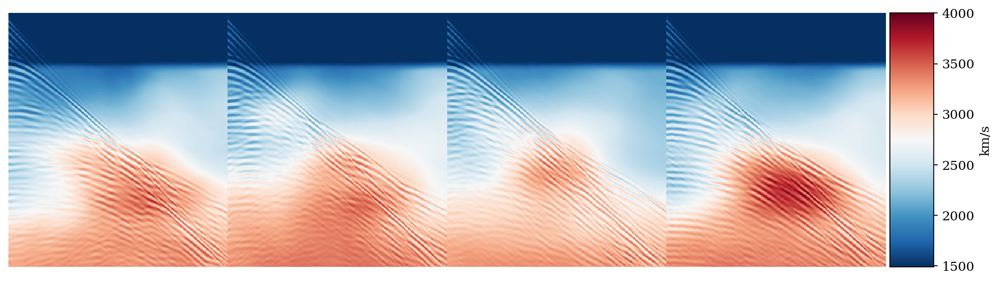

In [64]:
def plot_data3d_overlap(data3d, data3d_aux, ncols = 15, clip=0.05, kmix=1, figsize_coeffs=(1, 1), **kwargs):
    nimgs = data3d.shape[0]
    nrows = int(np.ceil(nimgs / ncols))
    nempty = nrows * ncols - nimgs
    _np, _no, _nt = data3d.shape
    extended_pred = np.concatenate([data3d, np.zeros((nempty, _no, _nt))])
    extended_pred_aux = np.concatenate([data3d_aux, np.zeros((nempty, _no, _nt))])
    
    the_max = np.max(extended_pred_aux)
    the_clip = clip * the_max
    extended_pred_aux[extended_pred_aux > the_clip] = the_clip
    extended_pred_aux[extended_pred_aux < -the_clip] = -the_clip
    the_max = np.max(extended_pred_aux)
    extended_pred_mix = extended_pred + kmix * extended_pred_aux / the_max  * np.max(extended_pred)
    
    table = [[extended_pred_mix[ncols*irow + icol, ...] for icol in range(ncols)] for irow in range(nrows)]
    vis.plot_nxm(table, figsize=(figsize_coeffs[0] * ncols, figsize_coeffs[1] * nrows), 
                 colorbar=True, cax_label='km/s', **kwargs)
    
ncols = 4
plot_data3d_overlap(preds[0][::every_nth_shot, ...], cube_cgg_h[::every_nth_shot, ...],
                   ncols=ncols, 
                    cmap='RdBu_r',
                   kmix=0.075, clip=0.1,  vmin=box_min, vmax=box_max,
                   figsize_coeffs=(4, 4))

In [65]:
print(hft.shape, len(fnames))

(1, 324, 376) 80


(1035, 376)


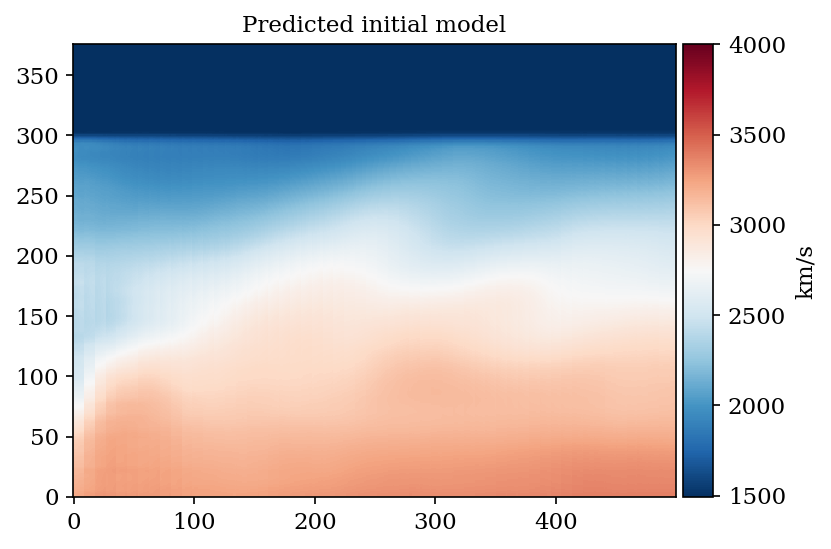

In [66]:
# importlib.reload(vis)
dsrc = 9 # points between sources
model = np.zeros((hft.shape[1] + (len(fnames)-1)*dsrc, hft.shape[-1]))
overlaps = np.zeros_like(model)
print(overlaps.shape)
models = []
for inet in range(len(selected_nets)):
    model = np.zeros((hft.shape[-2] + dsrc * (len(fnames) - 1), hft.shape[-1]))
    for i in range(len(fnames)):
        model[dsrc*i:dsrc*i+hft.shape[-2], :] += preds[inet][i,...]
        overlaps[dsrc*i:dsrc*i+hft.shape[-2], :] += 1
    model_norm = model / overlaps
    models.append(model_norm)
    vis.plot_model(np.flip(model_norm.T, 0)[:, :500], title='Predicted initial model', cmap='RdBu_r', vmin=box_min, vmax=box_max)

(1035, 376)


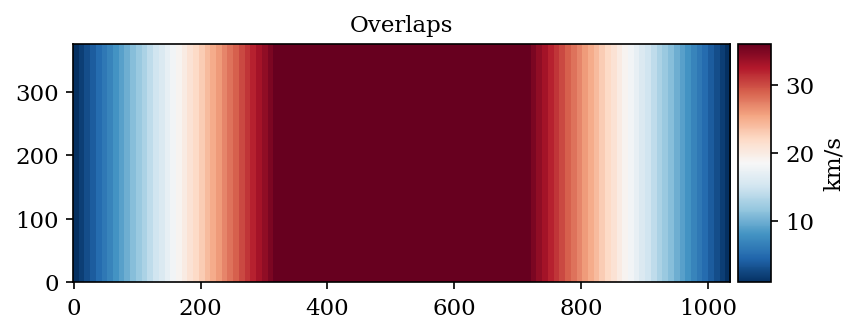

In [67]:
vis.plot_model(overlaps.T, title='Overlaps')
print(overlaps.shape)